<a href="https://colab.research.google.com/github/carlosamuel8/Trabalho3-mineracao-de-dados/blob/main/Lista03.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a target="_blank" href="https://colab.research.google.com/github/paulotguerra/QXD0178/blob/main/03.E0-Exercicio-Agrupamento-de-Dados.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## QXD0178 - Mineração de Dados
# Agrupamento de dados

**Professor:** Paulo de Tarso Guerra Oliveira ([paulodetarso@ufc.br](mailto:paulodetarso@ufc.br))


# Lista de Exercícios: Agrupamento de dados

Nesta lista de exercícios, você explorará a aplicação de métodos de aprendizado de máquina para realizar tarefas de agrupamento de dados (*clustering*). Você usará a base de dados [Iris plants dataset](https://scikit-learn.org/stable/datasets/toy_dataset.html#iris-plants-dataset) e avaliará algoritmos de agrupamento para comparar sua efetividade. O objetivo é entender como diferentes métodos de aprendizado de máquina se comportam em relação à tarefa de agrupamento de dados.

Você deverá utilizar os algoritmos [K-Means](https://scikit-learn.org/stable/modules/clustering.html#k-means), [Gaussian Mixture](https://scikit-learn.org/stable/modules/mixture.html#mixture) e [DBSCAN](https://scikit-learn.org/stable/modules/clustering.html#dbscan) e comparar o resultado produzido por cada modelo para o seguinte conjunto de hiperparâmtros, quando aplicável aquele modelo.

* K-means:
    * Centróides (`n_clusters`): 2, 3, e 6.    
* Gaussian Mixture
    * Componentes (`n_components`): 2, 3, e 6
    * Covariância (`covariance_type`): `'full'`, `'diag'` e `'spherical'`
* DBSCAN:
    * Distância (`eps`): 0.5, 1 e 1.5.
    * Mínimo de amostras (`min_samples`): 5, 10 e 25.


Como parte do objetivo praticar visualizações de dados, para cada experimento, você deve replicar a seguinte visualização usando apenas o [matplotlib](https://matplotlib.org/stable/users/index).

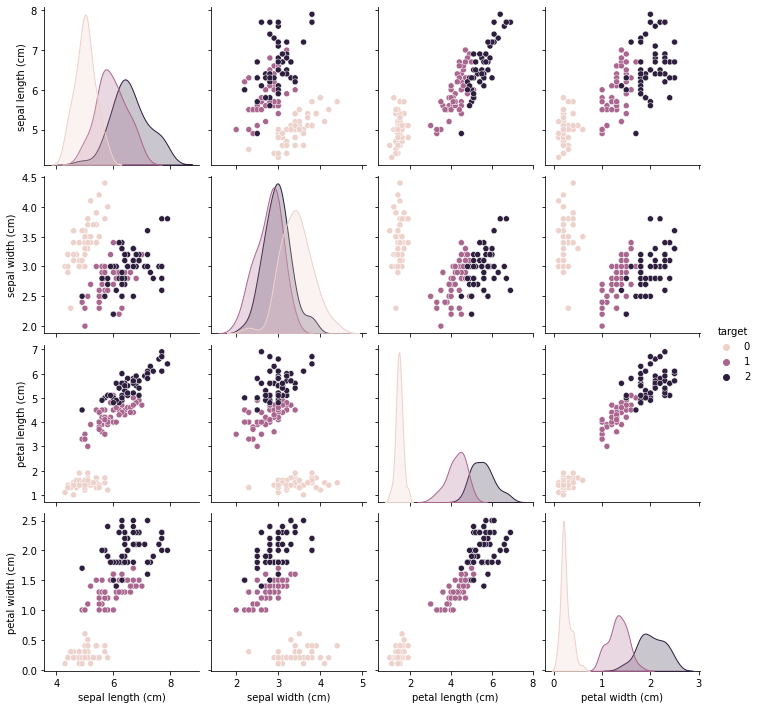

Você deve executar o experimento para cada par *features*, colorindo de acordo com o resultado fornecido pelo modelo de clusterização. Nos elementos da diagonal, você deve executar o cálculo de densidade dos elementos do conjunto usando `KDE` (`bandwidth=1.0, kernel='gaussian'`), também de acordo com a saída do modelo. Compare os experimentos entre si e com o que deveria ser a saída correta dos dados, segundo os rótulos originais do *dataset*.

Documente todas as etapas em um arquivo Jupyter Notebook (`.ipynb`) que inclua as análises, o código e as justificativas. Lembre-se de que é fundamental justificar todas as decisões tomadas ao longo do processo e documentar as análises de forma clara e concisa. Este trabalho tem como objetivo proporcionar uma compreensão prática da seleção e avaliação de algoritmos de agrupamento em cenários de aprendizado não-supervisionado.

Envie seu Jupyter Notebook até a data de entrega especificada nesta tarefa.

## Solução


### Introdução

Nesse trabalho, abordarei cada algoritmo separadamente, descrevendo brevemente seu funcionamento, e em seguida testando todas as combinações de parâmetros solicitados. Para cada modelo criei uma função que recebe os parâmetros que serão testados e plota o pairplot correspondente.

Importações necessárias

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KernelDensity

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN

import warnings
warnings.filterwarnings(action='ignore')


### Carga do conjunto de dados

In [ ]:
# Carregando os dados
iris = load_iris()
data = iris.data
target = iris.target
feature_names = iris.feature_names

# Criando o DataFrame
df = pd.DataFrame(data, columns=feature_names)
df['target'] = target

df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


Função criada para plotar a densidade

In [ ]:
def plot_density(data, labels, ax, colors):
    # Obtém as classes únicas presentes nos rótulos
    classes = np.unique(labels)

    for class_val, color in zip(classes, colors):
        # Seleciona os dados pertencentes à classe atual
        class_data = data[labels == class_val]

        # Inicializa e ajusta o KDE para a classe atual
        kde = KernelDensity(bandwidth=1.0, kernel='gaussian')
        kde.fit(class_data.reshape(-1, 1))

        # Gera valores de x para o gráfico
        x_vals = np.linspace(class_data.min(), class_data.max(), 1000).reshape(-1, 1)

        # Calcula a pontuação de log-densidade para os valores de x
        log_dens = kde.score_samples(x_vals)

        # Calcula as densidades reais a partir das pontuações de log
        y_vals = np.exp(log_dens)

        # Plota a curva de densidade no eixo fornecido
        ax.plot(x_vals, y_vals, label=f'Cluster {class_val}', color=color)

### K-means

Entendendo o K-means:

O K-means é um algoritmo de clusterização não supervisionado que agrupa os dados em k clusters, onde k é um valor especificado pelo usuário. O algoritmo funciona da seguinte forma:

Inicializa k centróides aleatórios.
1. Para cada ponto de dados, atribui-o ao cluster cujo centróide é o mais próximo.
2. Atualiza os centróides para serem a média dos pontos de dados em cada cluster.
3. Repita os passos 2 e 3 até que os centróides não mudem mais.

In [ ]:
def gerar_pairplot_KM(n_clusters):

    # Normalizando os dados
    data_normalized = StandardScaler().fit_transform(data)

    # Aplicando o K-Means com o parametro escolhido
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(data_normalized)

    # Definindo cores para os clusters
    unique_labels = np.unique(labels)
    cluster_colors = plt.cm.plasma(np.arange(len(unique_labels)) / len(unique_labels))

    # Reduzindo a dimensionalidade para visualização (usando PCA)
    pca = PCA(n_components=2)
    data_pca = pca.fit_transform(data_normalized)

    # Criando um DataFrame com os resultados
    result_df = pd.DataFrame(data_pca, columns=['PCA1', 'PCA2'])
    result_df['Cluster'] = labels

    # Adicionando as classes originais ao DataFrame
    result_df['Class'] = target

    # Gerando subgráficos para visualização
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(16, 16))
    plt.tight_layout(pad=0.5)

    # Iterando sobre todas as combinações de características
    for i in range(4):
        for j in range(4):
            # Se estiver na diagonal, plota os gráficos de densidade
            if i == j:
                plot_density(data_normalized[:, i], labels, axes[i, j], cluster_colors)
                axes[i, j].set_title(feature_names[i])

            else:
                # Se estiver fora da diagonal, plota o gráfico de dispersão
                scatter = axes[i, j].scatter(data_normalized[:, j], data_normalized[:, i], c=cluster_colors[labels], s=50)
                axes[i, j].set_xlabel(feature_names[j])
                axes[i, j].set_ylabel(feature_names[i])


    # Adiciona a legenda
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in cluster_colors]
    fig.legend(handles, [f'Cluster {label}' for label in unique_labels], title='Clusters', loc='upper right', bbox_to_anchor=(1.1, 1.0))

    plt.tight_layout()
    plt.show()

#### n_clusters = 2

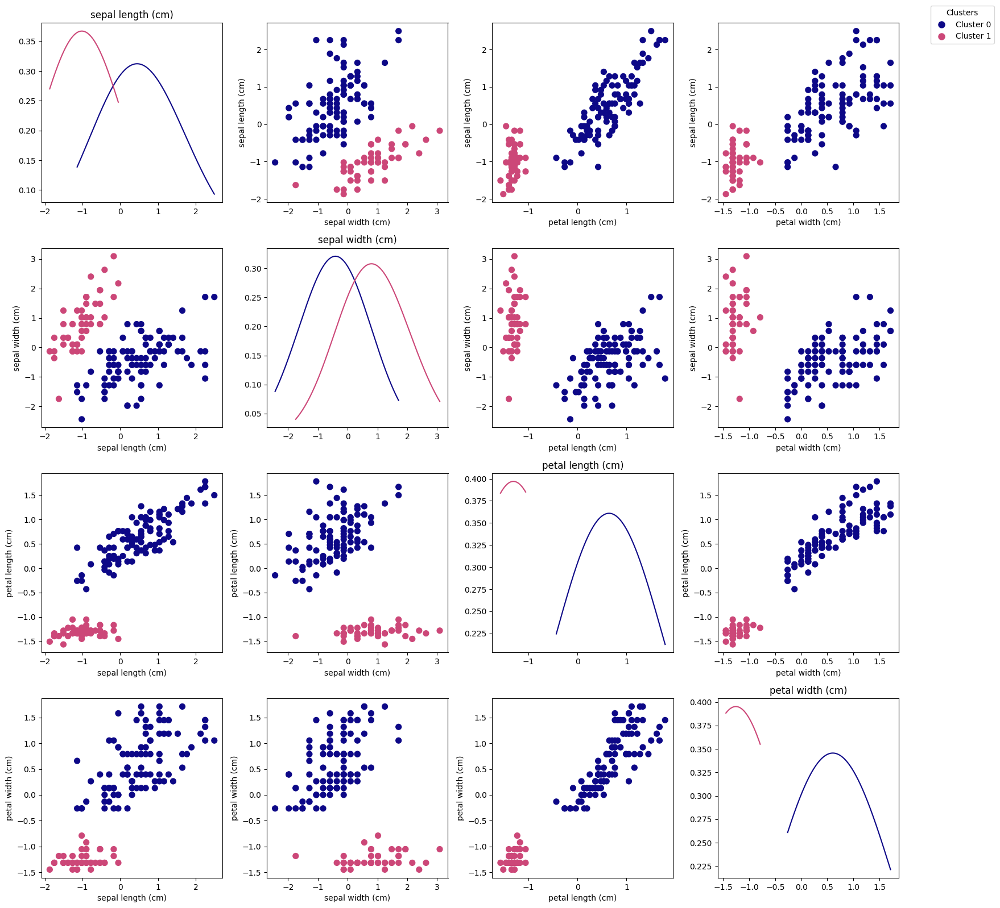

In [ ]:
gerar_pairplot_KM(2)

#### n_clusters = 3

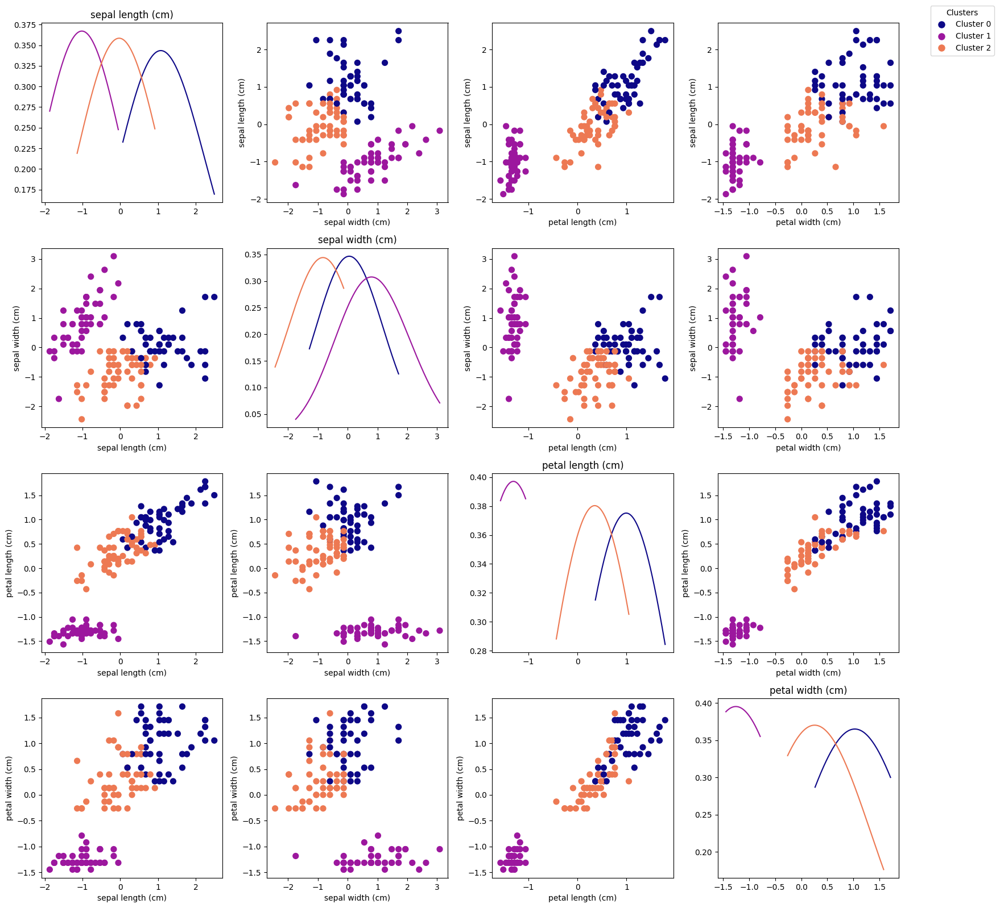

In [ ]:
gerar_pairplot_KM(3)

#### n_clusters = 6

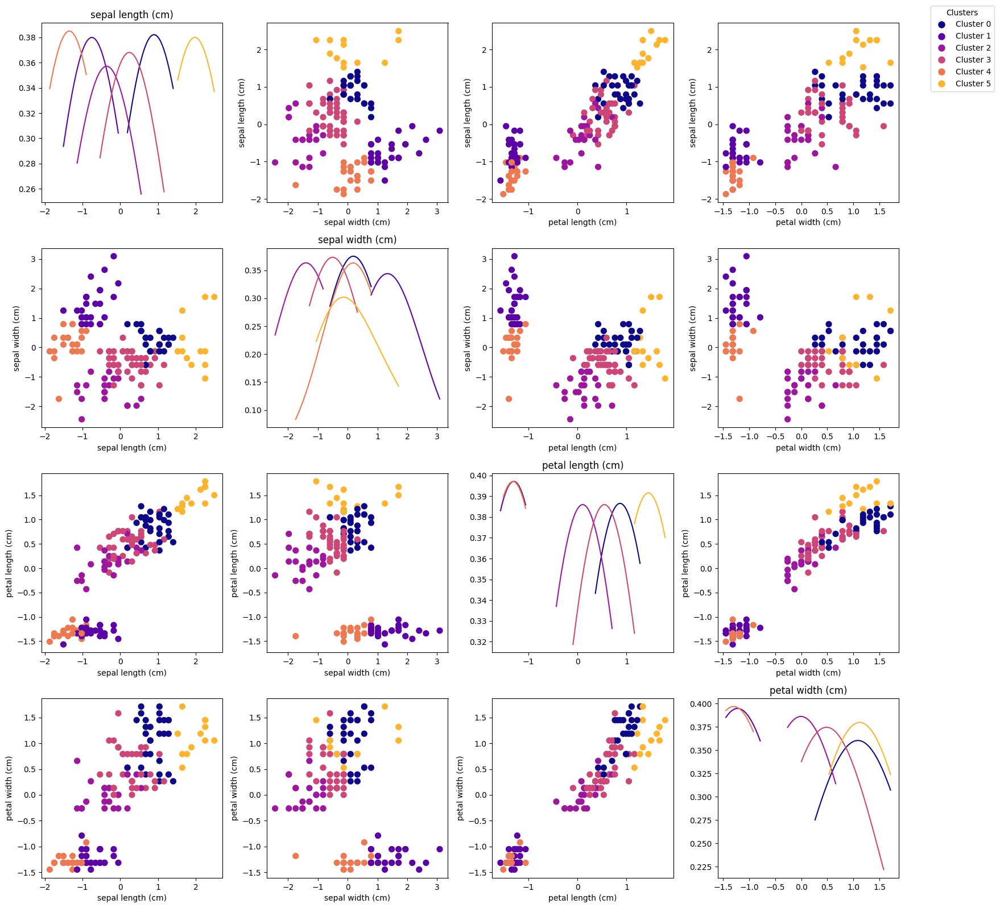

In [ ]:
gerar_pairplot_KM(6)

### Gaussian Mixture

Entendendo o Gausian Mixture Model:

O Gaussian Mixture Model (GMM) é um algoritmo de clusterização não supervisionado que assume que os dados são gerados por uma mistura de k distribuições normais. O algoritmo funciona da seguinte forma:

1. Inicializa k distribuições normais aleatórias.
2. Para cada ponto de dados, atribui-lhe uma probabilidade de pertencer a cada cluster.
3. Atualiza as distribuições normais para refletir as probabilidades de cada ponto de dados pertencer a cada cluster.
4. Repita os passos 2 e 3 até que as distribuições normais não mudem mais.

In [ ]:
def gerar_pairplot_GM(n_components, covariance_type):

    # Normalizando os dados
    data_normalized = StandardScaler().fit_transform(data)

    # Aplicando o GMM com os parametros escolhidos
    gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=42)
    labels = gmm.fit_predict(data_normalized)

    # Definindo cores para os clusters
    unique_labels = np.unique(labels)
    cluster_colors = plt.cm.plasma(np.arange(len(unique_labels)) / len(unique_labels))

    # Reduzindo a dimensionalidade para visualização (usando PCA)
    pca = PCA(n_components=2)
    data_pca = pca.fit_transform(data_normalized)

    # Criando um DataFrame com os resultados
    result_df = pd.DataFrame(data_pca, columns=['PCA1', 'PCA2'])
    result_df['Cluster'] = labels

    # Adicionando as classes originais ao DataFrame
    result_df['Class'] = target

    # Gerando subgráficos para visualização
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(16, 16))
    plt.tight_layout(pad=0.5)

    # Iterando sobre todas as combinações de características
    for i in range(4):
        for j in range(4):
            # Se estiver na diagonal, plota os gráficos de densidade
            if i == j:
                plot_density(data_normalized[:, i], labels, axes[i, j], cluster_colors)
                axes[i, j].set_title(feature_names[i])

            else:
                # Se estiver fora da diagonal, plota o gráfico de dispersão
                scatter = axes[i, j].scatter(data_normalized[:, j], data_normalized[:, i], c=cluster_colors[labels], s=50)
                axes[i, j].set_xlabel(feature_names[j])
                axes[i, j].set_ylabel(feature_names[i])


    # Adiciona a legenda
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in cluster_colors]
    fig.legend(handles, [f'Cluster {label}' for label in unique_labels], title='Clusters', loc='upper right', bbox_to_anchor=(1.1, 1.0))

    plt.tight_layout()
    plt.show()

#### n_components = 2 e covariance_type = full

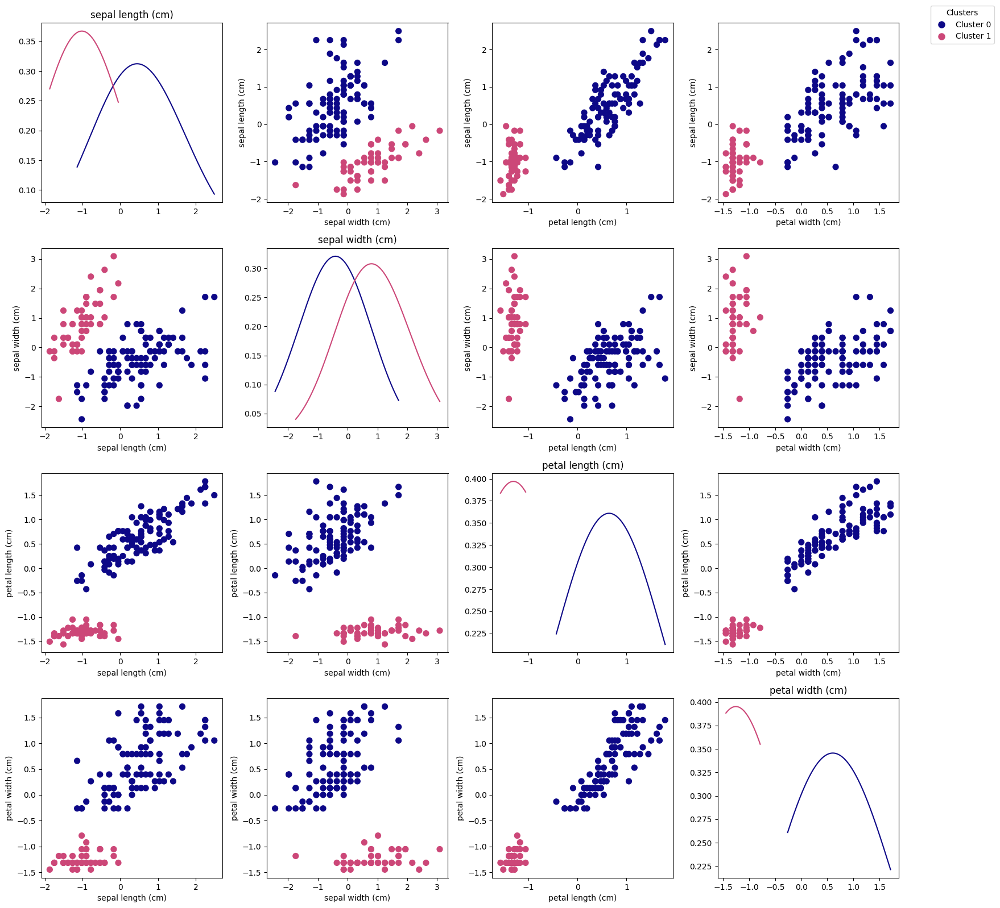

In [ ]:
gerar_pairplot_GM(n_components = 2, covariance_type = 'full')

#### n_components = 2 e covariance_type = diag

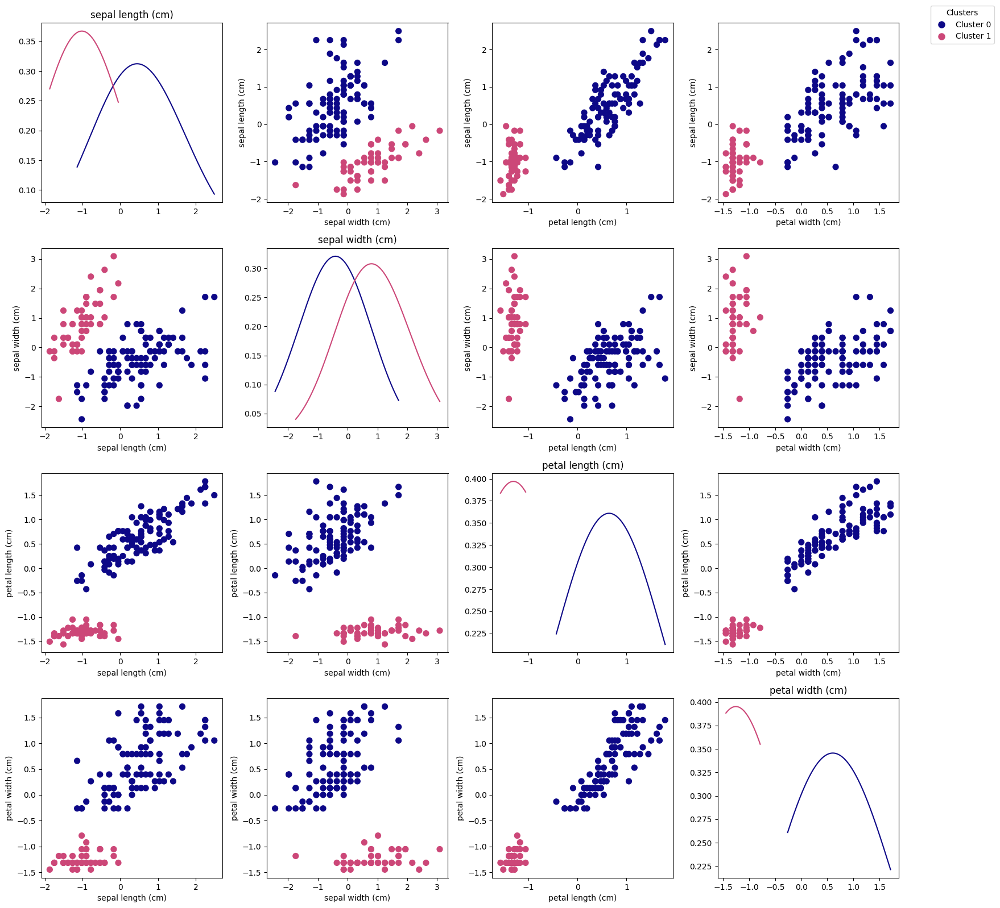

In [ ]:
gerar_pairplot_GM(n_components = 2, covariance_type = 'diag')

#### n_components = 2 e covariance_type = spherical

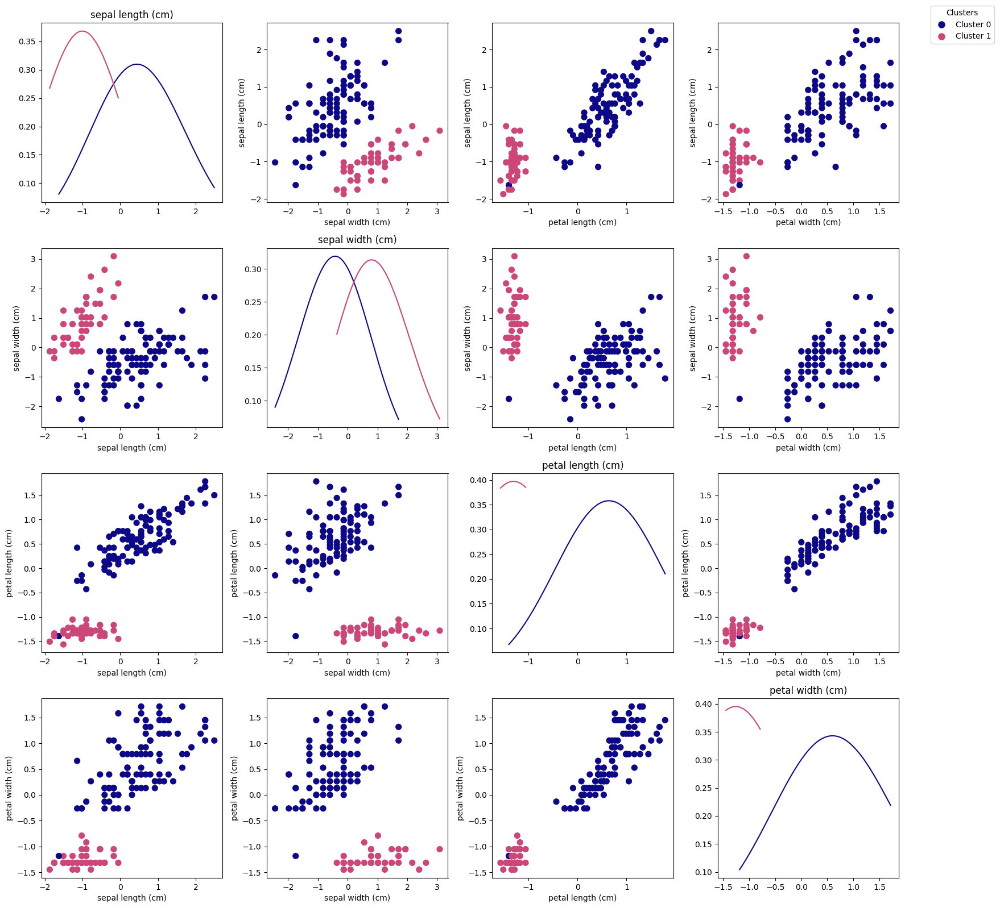

In [ ]:
gerar_pairplot_GM(n_components = 2, covariance_type = 'spherical')

#### n_components = 3 e covariance_type = full

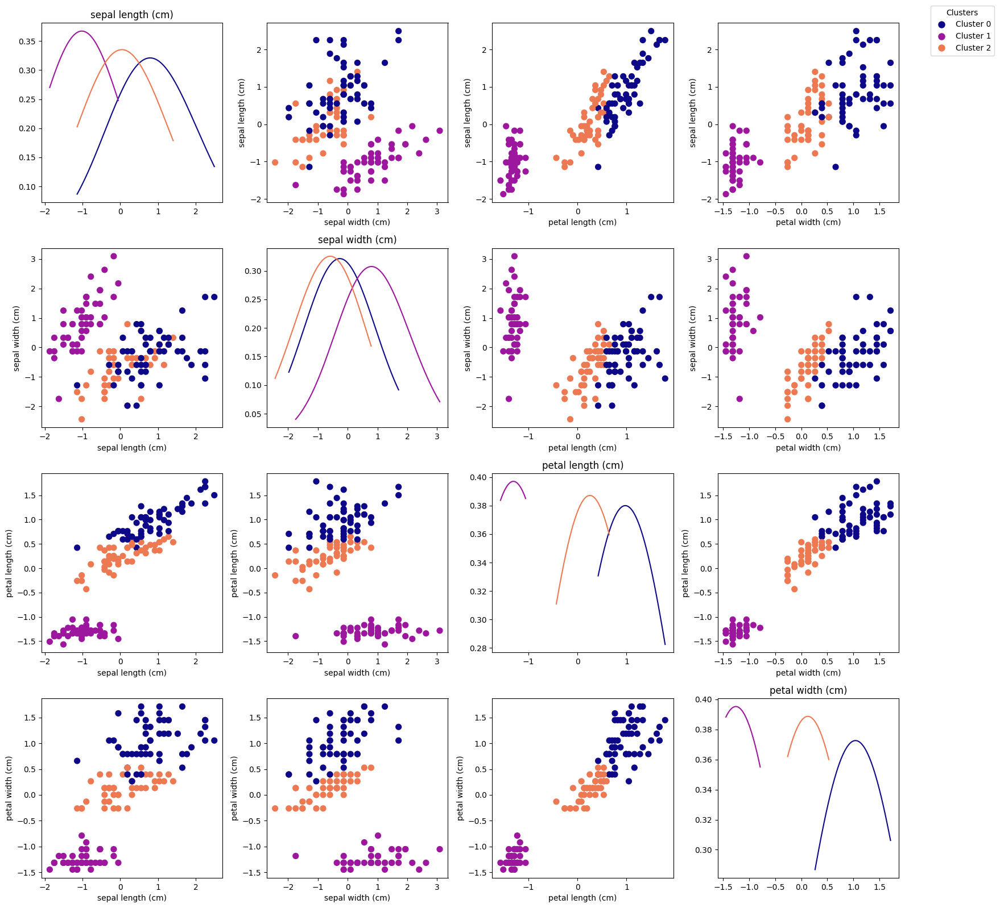

In [ ]:
gerar_pairplot_GM(n_components = 3, covariance_type = 'full')

#### n_components = 3 e covariance_type = diag

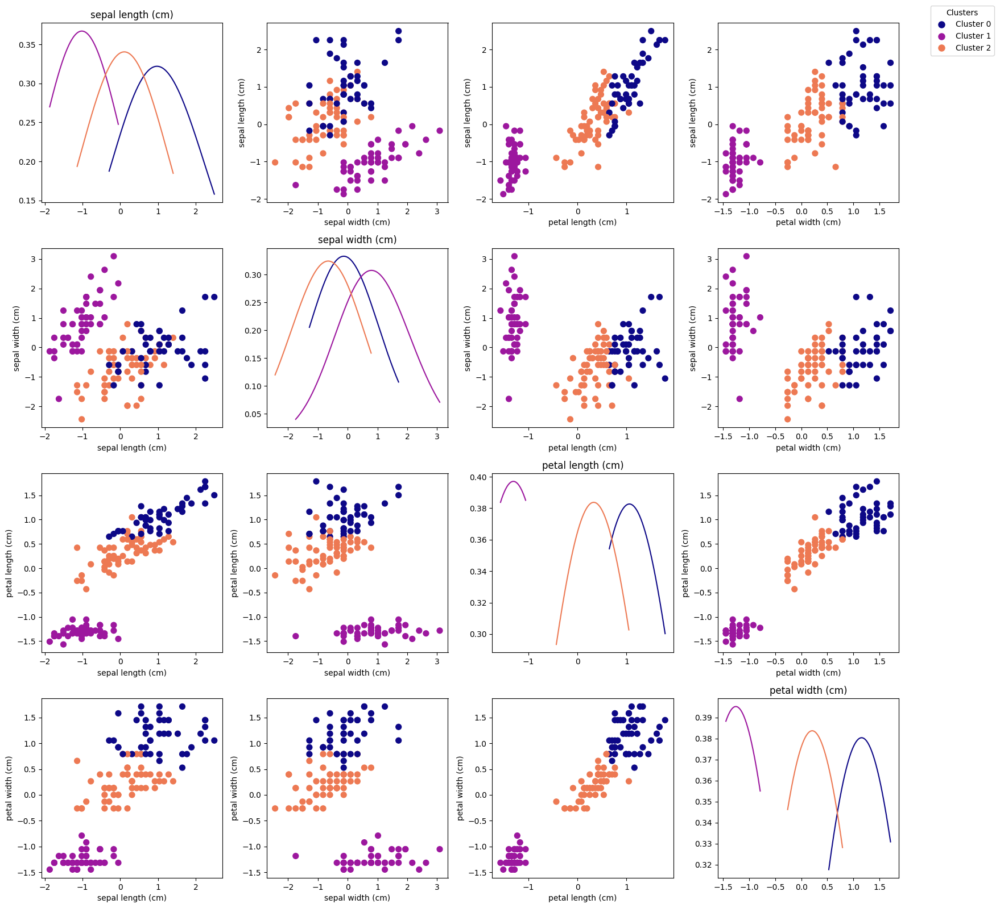

In [ ]:
gerar_pairplot_GM(n_components = 3, covariance_type = 'diag')

#### n_components = 3 e covariance_type = spherical

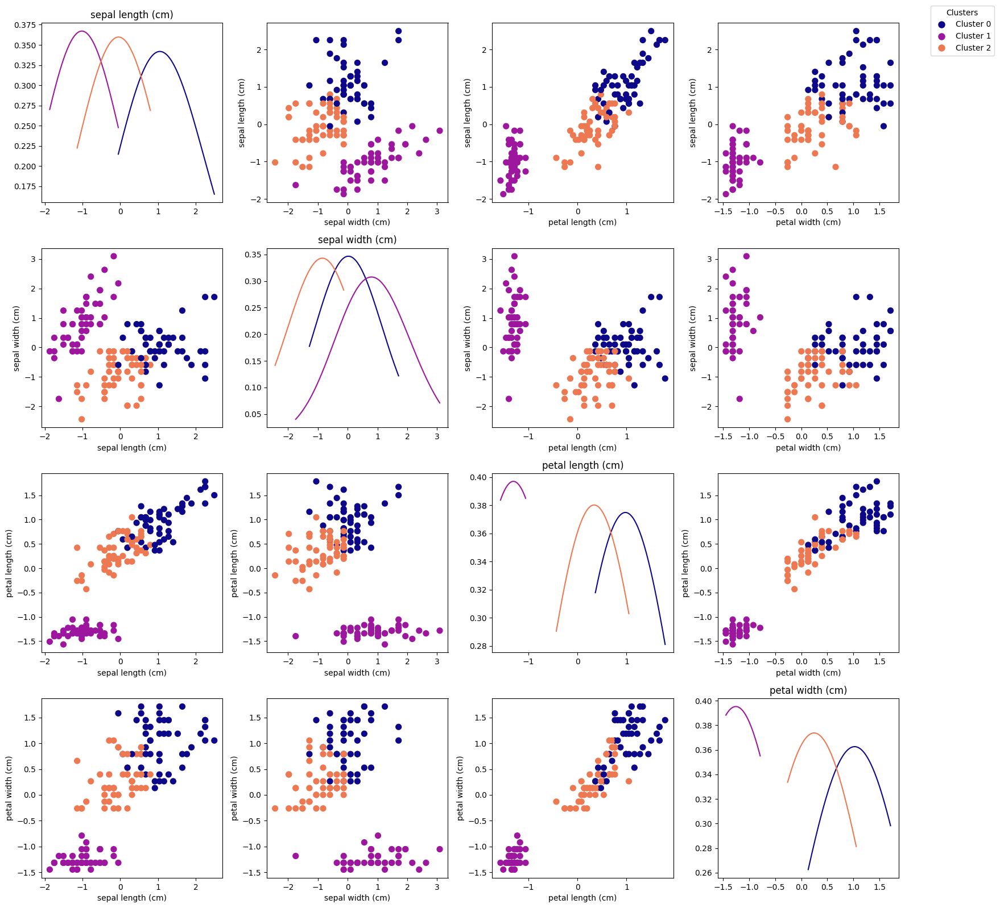

In [ ]:
gerar_pairplot_GM(n_components = 3, covariance_type = 'spherical')

#### n_components = 6 e covariance_type = full

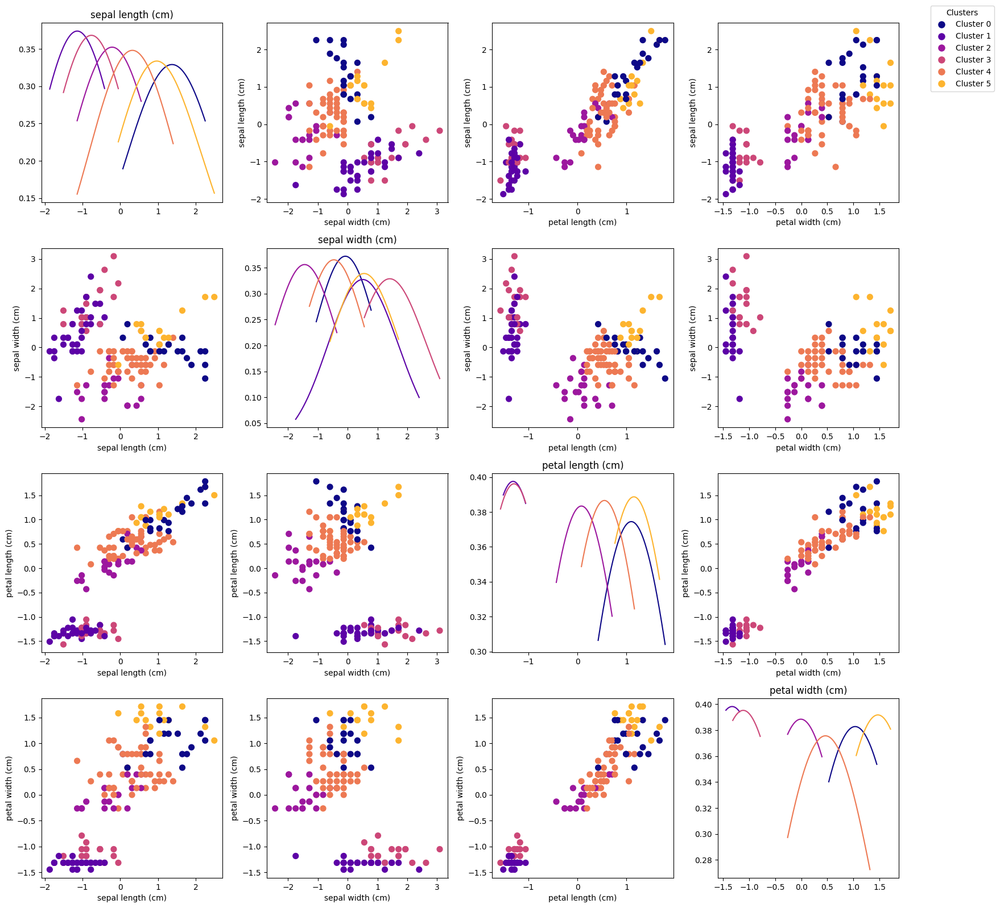

In [ ]:
gerar_pairplot_GM(n_components = 6, covariance_type = 'full')

#### n_components = 6 e covariance_type = diag

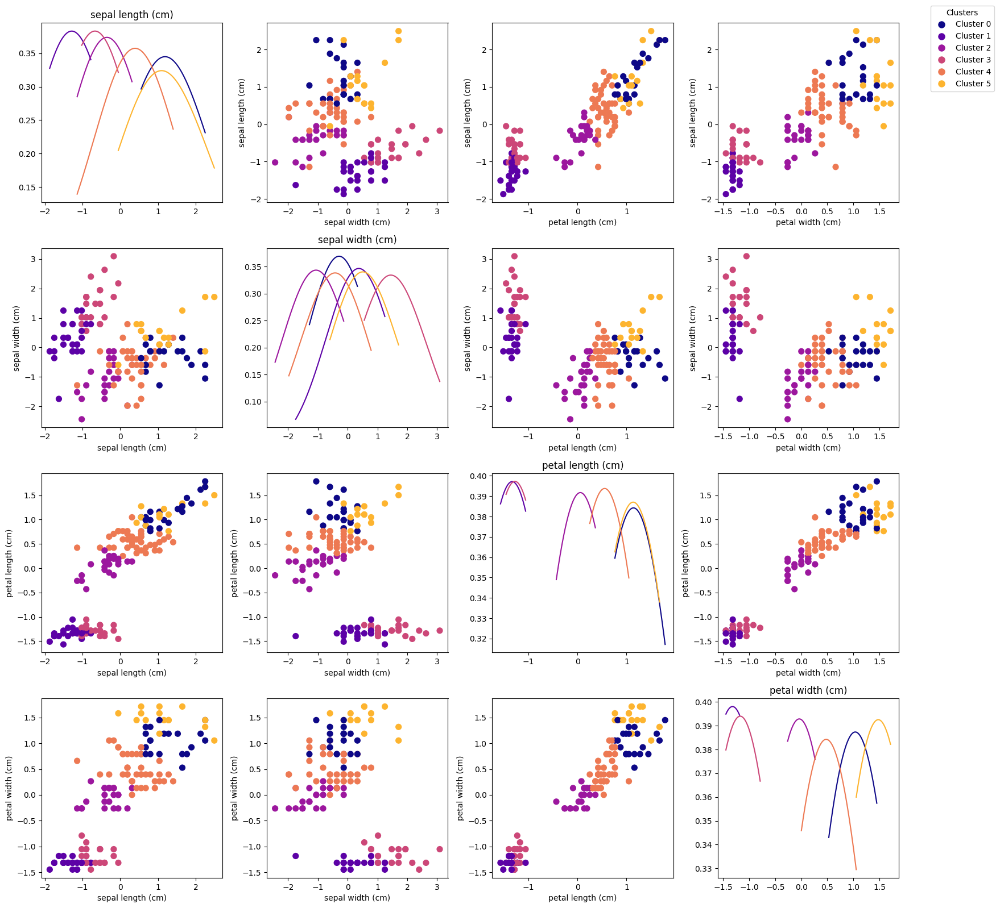

In [ ]:
gerar_pairplot_GM(n_components = 6, covariance_type = 'diag')

#### n_components = 6 e covariance_type = spherical

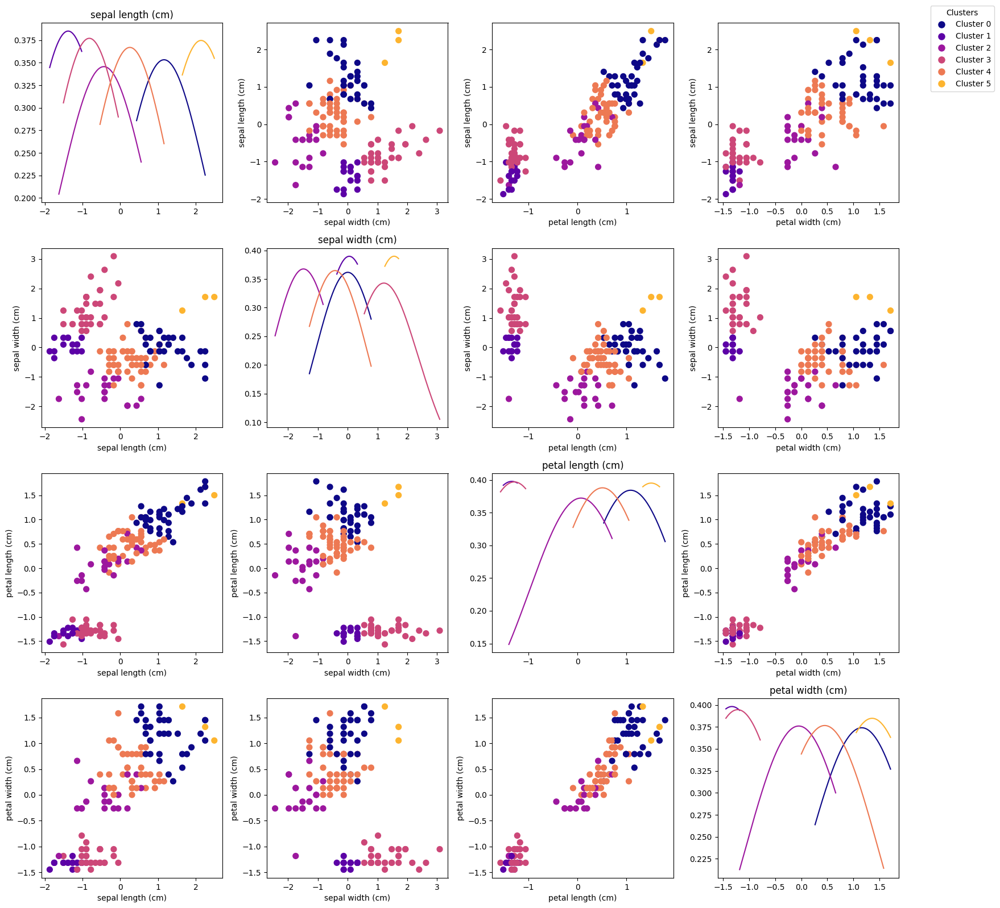

In [ ]:
gerar_pairplot_GM(n_components = 6, covariance_type = 'spherical')

### DBSCAN

Entendendo o DBSCAN:

O DBSCAN é um algoritmo de clusterização não supervisionado que agrupa os dados em clusters baseados em sua densidade. O algoritmo funciona da seguinte forma:

Inicializa um conjunto de pontos core.
1. Para cada ponto não core, encontra o seu ponto nearest neighbor.
2, Se a distância entre o ponto não core e seu ponto nearest neighbor for maior que um limiar especificado pelo usuário, o ponto não core é outlier.
3. Se a distância entre o ponto não core e seu ponto nearest neighbor for menor ou igual ao limiar, o ponto não core é border point.
4. Se o ponto não core é border point, ele é adicionado ao cluster do seu ponto nearest neighbor.
5. Repita os passos 2 a 5 até que não haja mais pontos não core a serem processados.

In [ ]:
def gerar_pairplot_DB(eps, min_samples):

    # Não é necessário normalizar os dados para o DBSCAN

    # Aplicando o DBSCAN com os parâmetros escolhidos
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(data)

    # Definindo cores para os clusters
    unique_labels = np.unique(labels)
    cluster_colors = plt.cm.plasma(np.arange(len(unique_labels)) / len(unique_labels))

    # Reduzindo a dimensionalidade para visualização (usando PCA)
    pca = PCA(n_components=2)
    data_pca = pca.fit_transform(data)

    # Criando um DataFrame com os resultados
    result_df = pd.DataFrame(data_pca, columns=['PCA1', 'PCA2'])
    result_df['Cluster'] = labels

    # Adicionando as classes originais ao DataFrame
    result_df['Class'] = target

    # Gerando subgráficos para visualização
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(16, 16))
    plt.tight_layout(pad=0.5)

    # Iterando sobre todas as combinações de características
    for i in range(4):
        for j in range(4):
           # Se estiver na diagonal, plota os gráficos de densidade
            if i == j:
                plot_density(data[:, i], labels, axes[i, j], cluster_colors)
                axes[i, j].set_title(feature_names[i])
            # Se estiver fora da diagonal, plota o gráfico de dispersão
            if i != j:
                scatter = axes[i, j].scatter(data[:, j], data[:, i], c=cluster_colors[labels], s=50)
                axes[i, j].set_xlabel(feature_names[j])
                axes[i, j].set_ylabel(feature_names[i])

    # Adiciona a legenda
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10) for color in cluster_colors]
    fig.legend(handles, [f'Cluster {label}' for label in unique_labels], title='Clusters', loc='upper right', bbox_to_anchor=(1.1, 1.0))

    plt.tight_layout()
    plt.show()

#### Eps = 0.5 e min_sales = 5

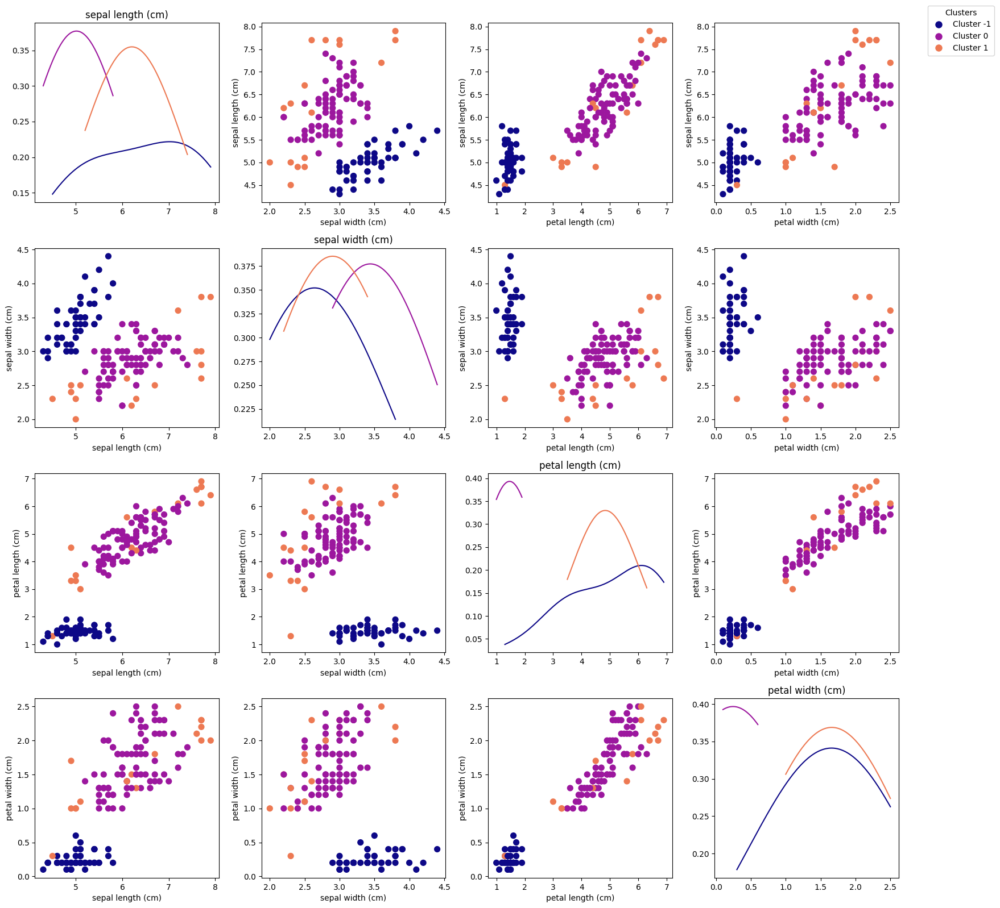

In [ ]:
gerar_pairplot_DB(eps=0.5, min_samples=5)

#### Eps = 0.5 e min_sales = 10

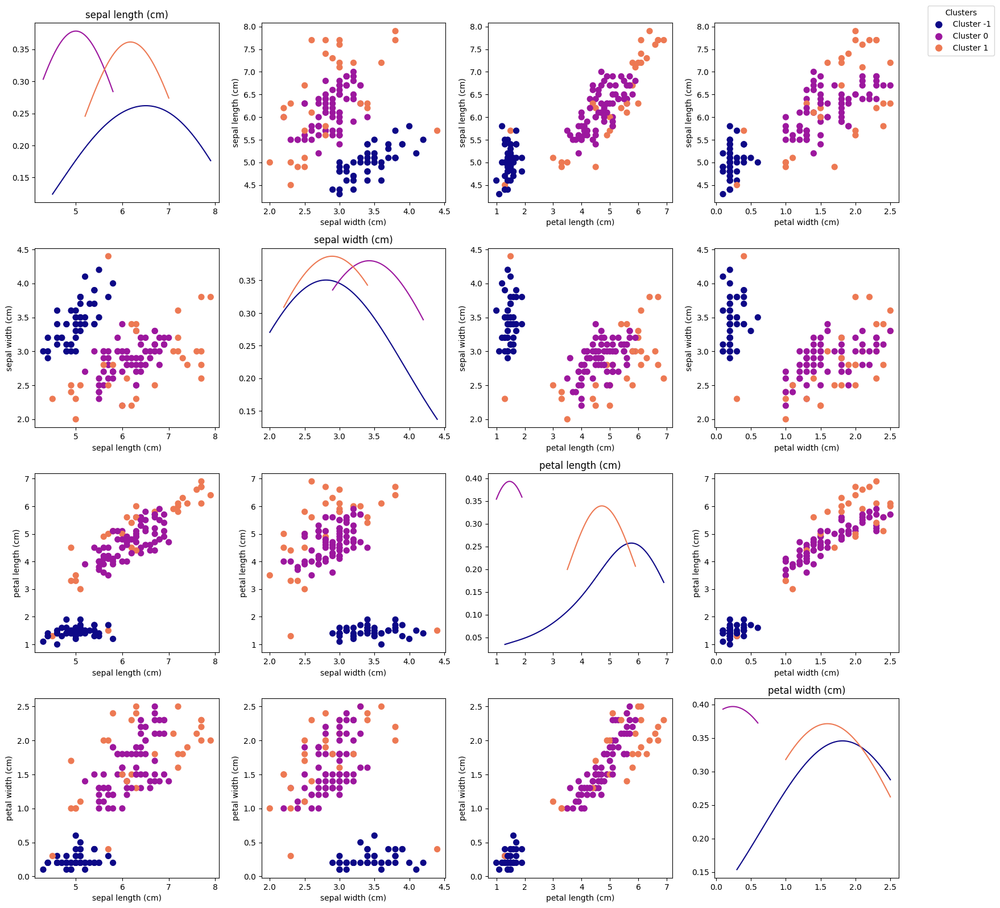

In [ ]:
gerar_pairplot_DB(eps=0.5, min_samples=10)

#### Eps = 0.5 e min_sales = 25

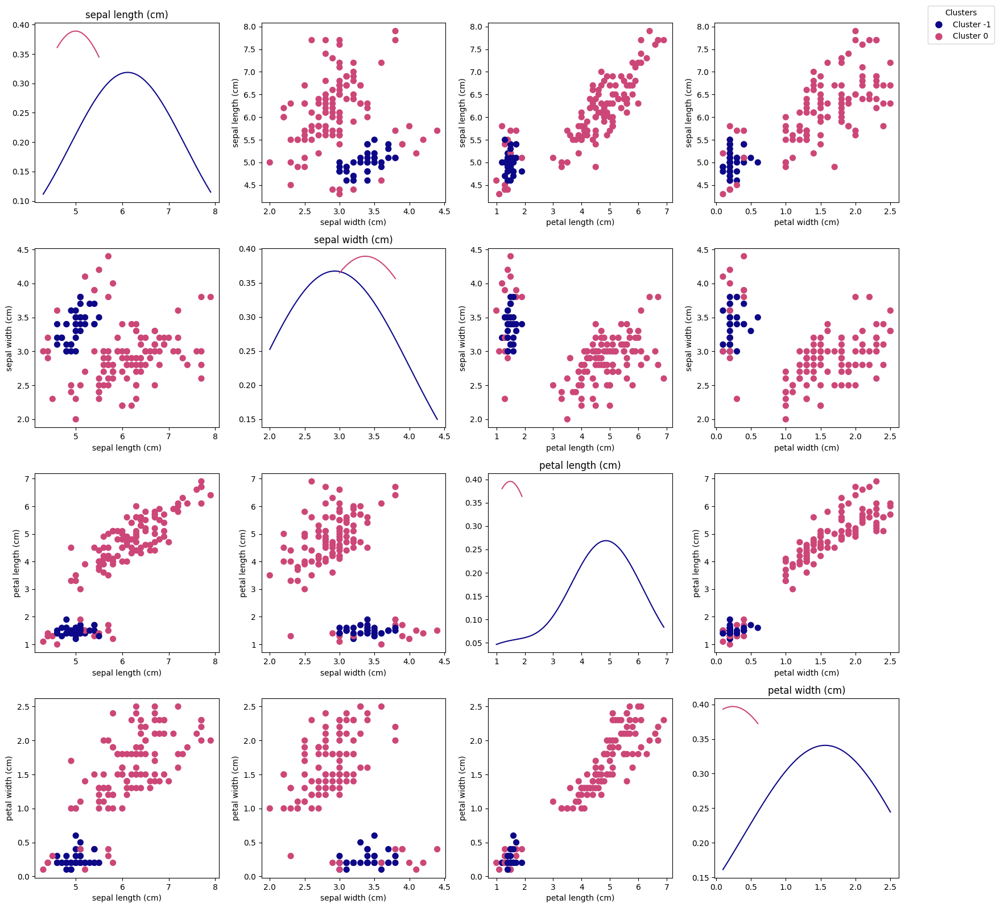

In [ ]:
gerar_pairplot_DB(eps=0.5, min_samples=25)

#### Eps = 1 e min_sales = 5

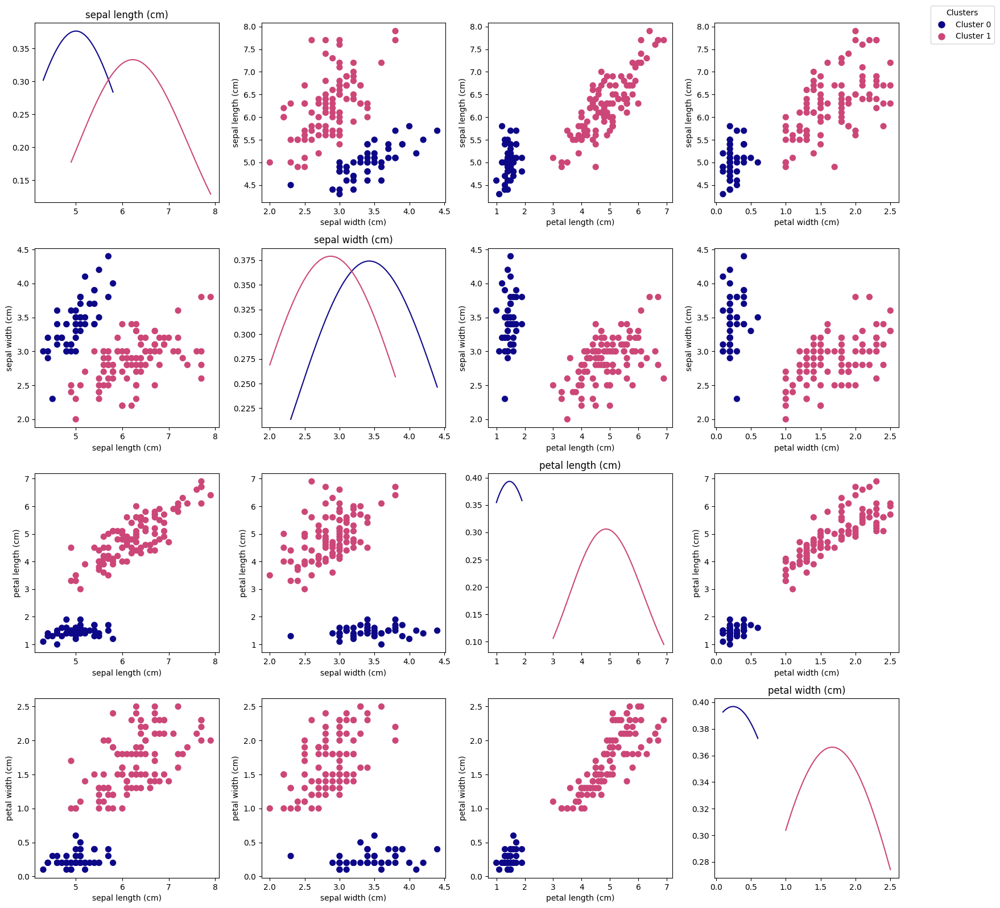

In [ ]:
gerar_pairplot_DB(eps=1, min_samples=5)

#### Eps = 1 e min_sales = 10

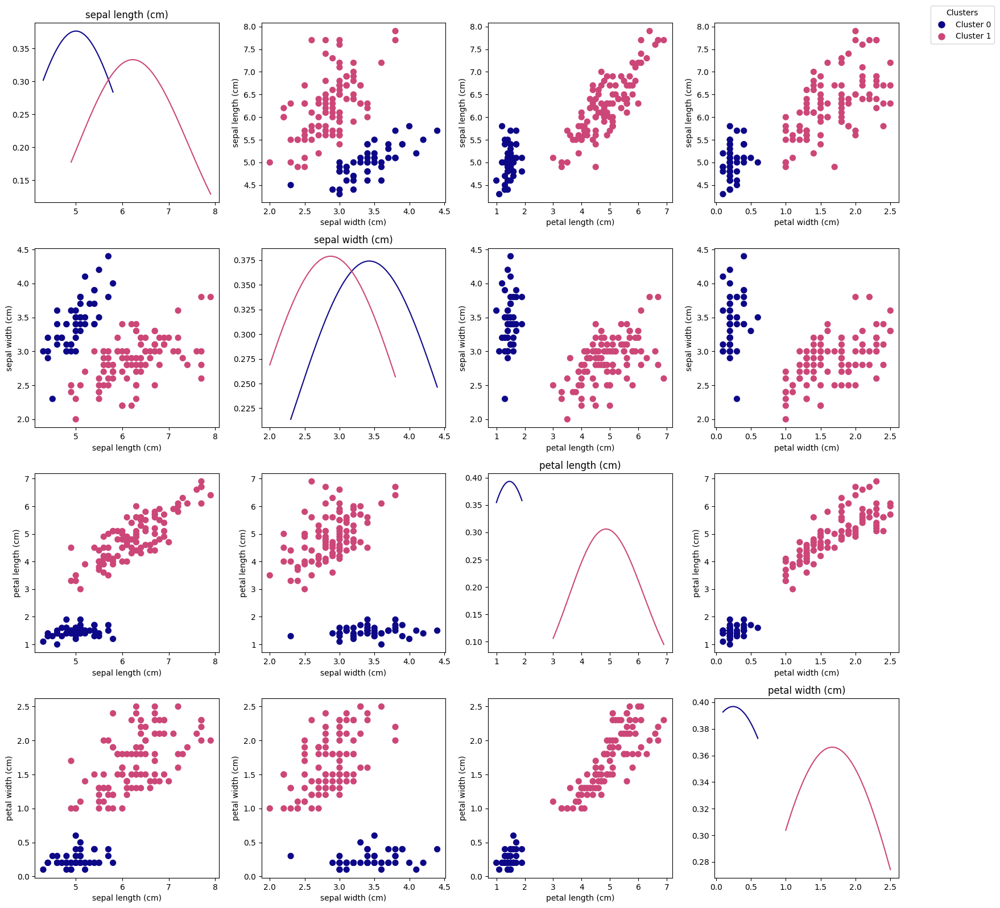

In [ ]:
gerar_pairplot_DB(eps=1, min_samples=10)

#### Eps = 1 e min_sales = 25

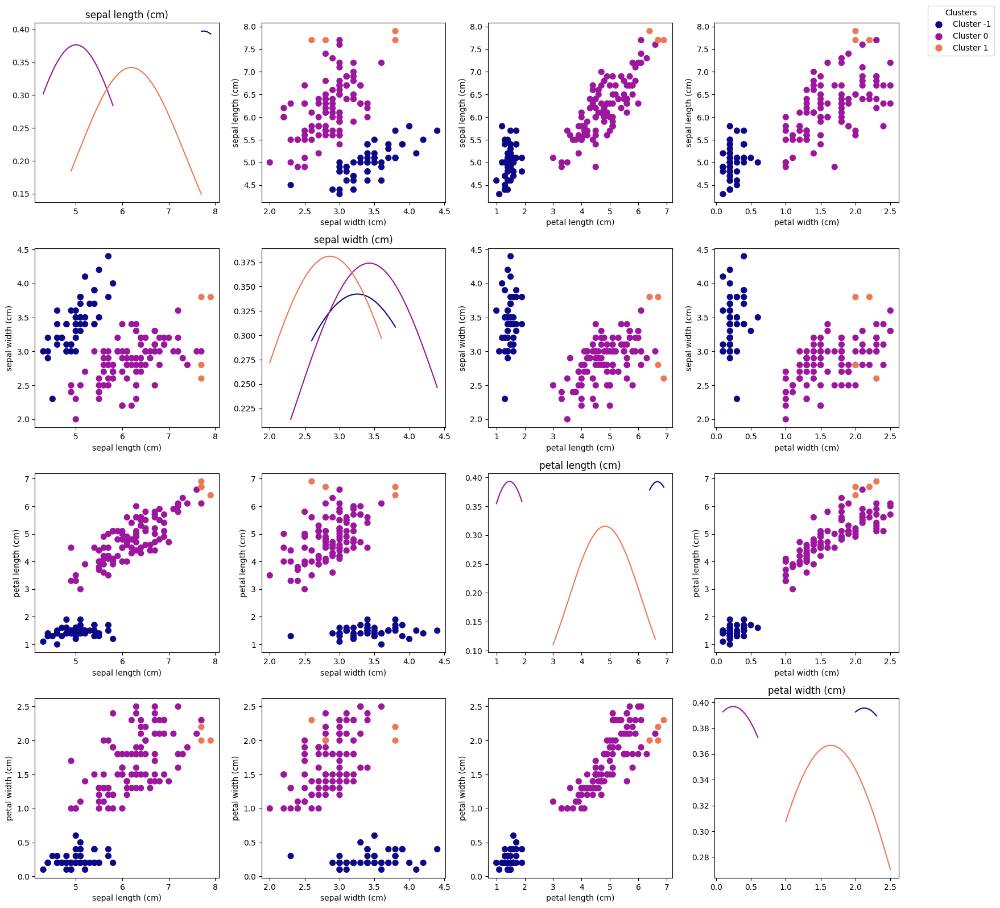

In [ ]:
gerar_pairplot_DB(eps=1, min_samples=25)

#### Eps = 1.5 e min_sales = 5

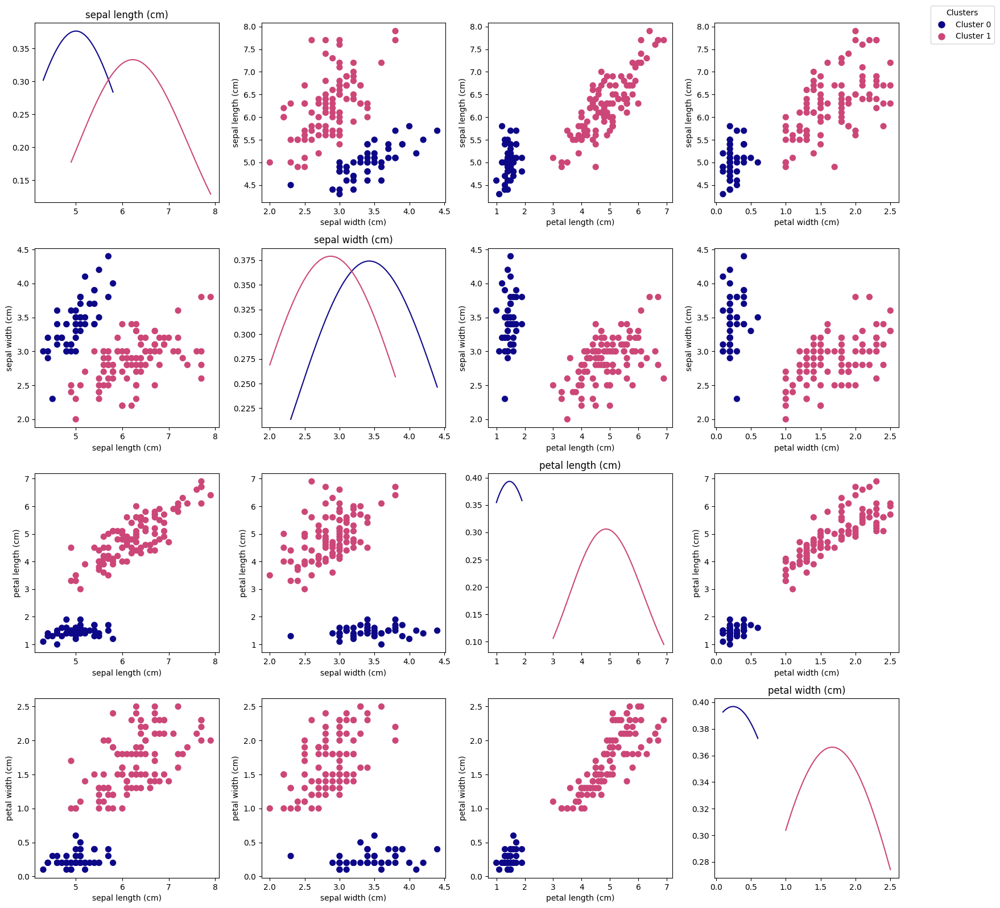

In [ ]:
gerar_pairplot_DB(eps=1.5, min_samples=5)

#### Eps = 1.5 e min_sales = 10

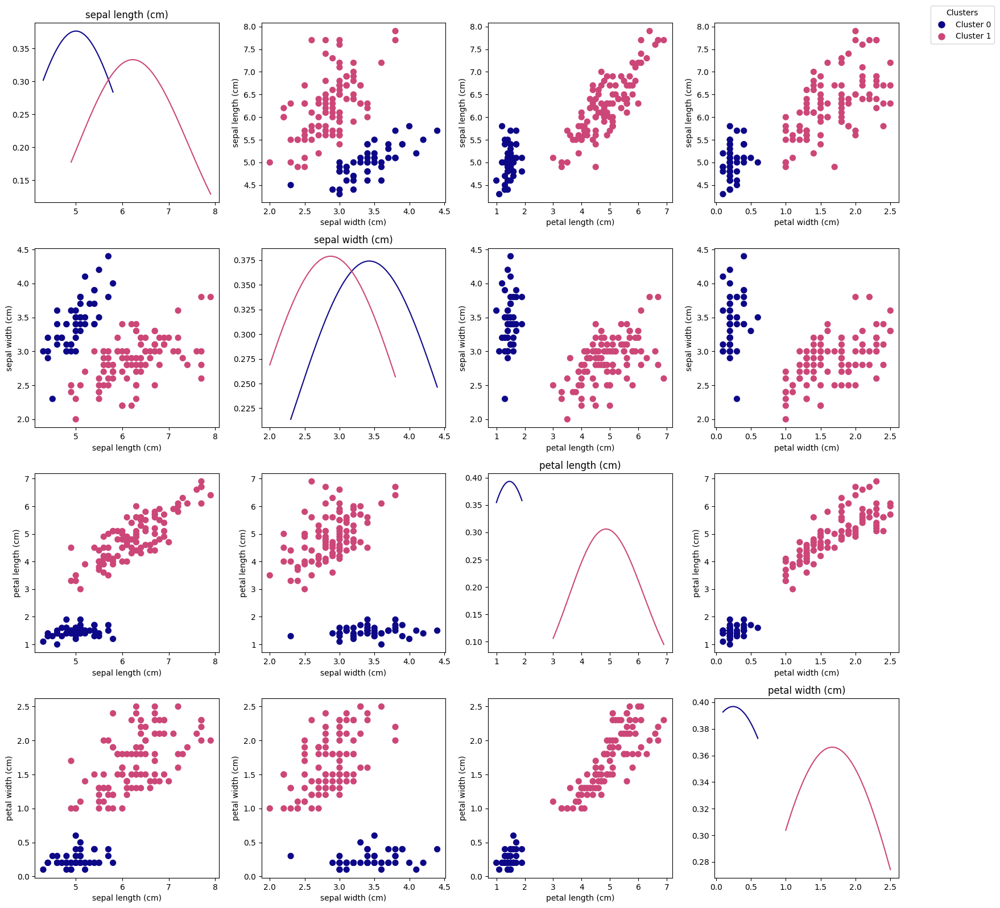

In [ ]:
gerar_pairplot_DB(eps=1.5, min_samples=10)

#### Eps = 1.5 e min_sales = 25

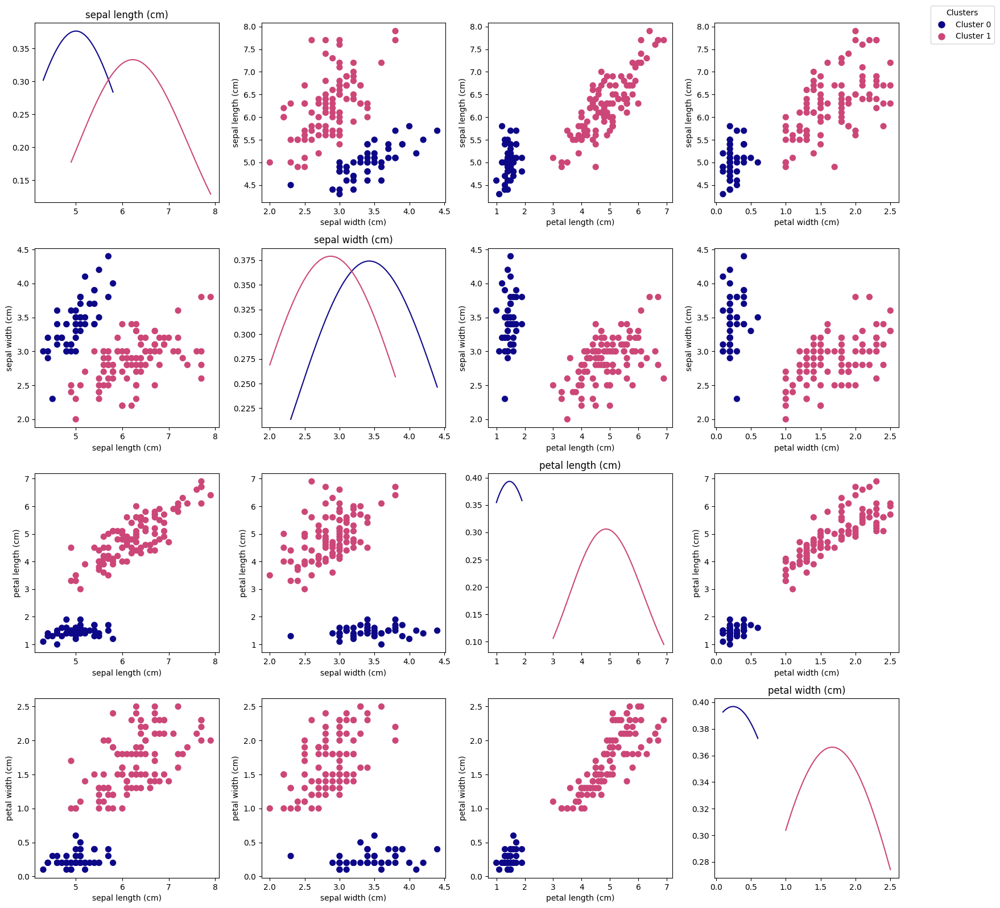

In [ ]:
gerar_pairplot_DB(eps=1.5, min_samples=25)

### Análise dos resultados

#### K-means

`n_clusters = 2:`

Observações: Os clusters apresentaram uma divisão mais clara, e alguns deles pareceram mais densos que outros. Isso sugere uma separação bem definida dos dados em duas categorias.

`n_clusters = 3:`

Observações: Ao aumentar o número de clusters para 3, dois dos clusters mostraram uma divisão menos clara, enquanto um deles permaneceu bem definido. A densidade global de cada cluster aumentou consideravelmente, uma vez que os pontos ficaram concentrado.

`n_clusters = 6:`

Observações: Com seis clusters, alguns deles não ficaram bem divididos, apresentando sobreposição ou mistura de pontos. No entanto, todos os clusters exibiram alta densidade, sugerindo uma tentativa de subdivisão mais granular dos dados, mas com problemas na separação.

#### Gausian Mixture

Configuração com `n_components = 2` e `covariance_type = full, diag, sphericall:`

> Observações: Surpreendentemente, os gráficos gerados para as configurações com `n_components = 2` e diferentes tipos de covariância (full, diag, sphericall) foram exatamente iguais(com o full e diag) ou muito semelhantes. Isso pode significar que o algoritmo está convergindo para as mesmas soluções, independentemente do tipo de covariância.



Configuração com `n_components = 3` e `covariance_type = full, diag, sphericall:`

> Observações: Ao aumentar o número de componentes para 3 e testar diferentes tipos de covariância, os gráficos gerados foram
bem semelhantes. Embora pequenas mudanças tenham ocorrido em alguns pontos, os clusters e os gráficos de densidade mantiveram uma alta similaridade.



Configuração com `n_components = 6` e `covariance_type = full, diag, sphericall:`

> Observações: Aumentar ainda mais o número de componentes para 6 resultou em gráficos semelhantes para covariance_type = full e covariance_type = diag. Conrudo, ao usar covariance_type = sphericall, um dos clusters ficou bem reduzido. Os gráficos de densidade também foram bem parecidos.

#### DBSCAN

`Eps = 0.5:`

> * Com MinPts = 5, o DBSCAN identificou 2 clusters.
> * Com MinPts = 10, o DBSCAN identificou 3 clusters.
> * Com MinPts = 25, o DBSCAN identificou 3 clusters.

> Observações: Aumentar o valor de MinPts parece estar dividindo alguns clusters em mais subgrupos.Resultou em uma variação no número de clusters com diferentes valores de MinPts. Isso pode significar  que a escolha de Eps é sensível à densidade dos dados.


`Eps = 1:`

> * Com MinPts = 5, o DBSCAN identificou 2 clusters.
> * Com MinPts = 10, o DBSCAN identificou 2 clusters.
> * Com MinPts = 25, o DBSCAN identificou 3 clusters, com um deles contendo poucos pontos.

> Observações: O aumento do valor de Eps está tendendo a agrupar mais pontos em um único cluster, mas há um caso onde alguns pontos são isolados em um cluster. Apesar de ter produzido um número diferente de clusters mudando o MinPts, os gráficos para MinPts = 5 e MinPts = 10 foram iguais. Isso pode indicar uma possível insensibilidade do modelo a pequenas mudanças em MinPts quando Eps é maior.

`Eps = 1.5:`

> * Com MinPts = 5, o DBSCAN identificou 2 clusters.
> * Com MinPts = 10, o DBSCAN identificou 2 clusters.
> * Com MinPts = 25, o DBSCAN identificou 2 clusters.

> Observações: Aumentar mais o valor de Eps parece resultar em menos clusters. Além disso, Eps = 1.5 resultou em clusters iguais independentemente do valor de MinPts. Por isso, é possível inferir que nesse caso um Eps maior tende a agrupar mais pontos em um único cluster.

### Conclusão


De modo geral, cada algoritmo apresentou um desempenho bom para o conjunto de dados, com alguns deles alcançando resultados mais melhores ao serem ajustados com parâmetros específicos. Como conclusão, obtive uma compreensão mais aprofundada do funcionamento de cada algoritmo, conhecendo suas peculiaridades e limitações. O maior desafio encontrado foi lidar com o matplotlib para simular o pairplot do seaborn, mas após superar essa dificuldade, a aplicação dos algoritmos tornou-se mais fácil.

Estou satisfeito com a experiência proporcionada por este trabalho. A disciplina, como um todo, foi muito proveitosa. Mesmo diante das limitações e imprevistos, ela proporcionou uma visão abrangente que certamente servirá como guia caso eu decida explorar mais profundamente algum desses tópicos no futuro.

### Referências

Matplotlib. (2023). Matplotlib: Visualization with Python. Disponível em: https://matplotlib.org/


Aydemir, K. K. (2022). "Visualizing Data with Pair-Plot Using Matplotlib." Endpoint Development. Disponível em: https://www.endpointdev.com/blog/2022/04/visualizing-data-with-pairplot-using-matplotlib/